In [2]:
!pip install -U pandas-profiling

     |████████████████████████████████| 324 kB 3.1 MB/s            
     |████████████████████████████████| 357 kB 37.9 MB/s            
     |████████████████████████████████| 394 kB 21.5 MB/s            
     |████████████████████████████████| 686 kB 14.3 MB/s            
     |████████████████████████████████| 293 kB 12.0 MB/s            
     |████████████████████████████████| 520 kB 55.2 MB/s            
     |████████████████████████████████| 3.7 MB 39.9 MB/s            
  Preparing metadata (setup.py) ... done
     |████████████████████████████████| 10.9 MB 24.3 MB/s            
     |████████████████████████████████| 104 kB 56.2 MB/s            
     |████████████████████████████████| 296 kB 41.5 MB/s            
     |████████████████████████████████| 6.9 MB 30.3 MB/s            
     |████████████████████████████████| 17.3 MB 32.3 MB/s            
     |████████████████████████████████| 43.6 MB 62.3 MB/s            
     |████████████████████████████████| 2.1 MB 50.4 MB/s    

In [3]:
!pip install ydata_profiling

You should consider upgrading via the '/usr/bin/python -m pip install --upgrade pip' command.


In [4]:
!pip install ipywidgets

     |████████████████████████████████| 139 kB 2.0 MB/s            
     |████████████████████████████████| 215 kB 17.0 MB/s            
     |████████████████████████████████| 2.3 MB 27.6 MB/s            
You should consider upgrading via the '/usr/bin/python -m pip install --upgrade pip' command.


In [18]:
!pip install --force-reinstall numpy==1.24.2

     |████████████████████████████████| 17.3 MB 2.2 MB/s            
  Attempting uninstall: numpy
    Found existing installation: numpy 1.24.0
    Uninstalling numpy-1.24.0:
      Successfully uninstalled numpy-1.24.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.5.0+nv requires numpy~=1.19.2, but you have numpy 1.24.2 which is incompatible.
tensorflow 2.5.0+nv requires typing-extensions~=3.7.4, but you have typing-extensions 4.10.0 which is incompatible.
smac 1.1.1 requires scipy>=1.7.0, but you have scipy 1.5.4 which is incompatible.
auto-sklearn 0.14.3 requires scipy>=1.7.0, but you have scipy 1.5.4 which is incompatible.
You should consider upgrading via the '/usr/bin/python -m pip install --upgrade pip' command.


In [3]:
from pathlib import Path

import pandas as pd

import numpy as np

# Our package
from ydata_profiling import ProfileReport
from ydata_profiling.utils.cache import cache_file

In [4]:
df = pd.read_csv("../data/CreditCardFraudFourYears.csv")

In [6]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

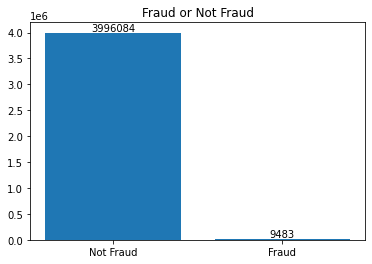

In [5]:
labels = ["Not Fraud", "Fraud"]
counts = df.groupby(["is_fraud"]).count()["first"]

fig, ax = plt.subplots()
bars = ax.bar(labels, counts)

ax.set_title("Fraud or Not Fraud")

for bar in bars:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, yval + 0.05, yval, ha='center', va='bottom')

plt.show()

### What is the distribution between fraudulent and non-fraudulent transactions?

As we can see above, this dataset has a major difference between fraudulent and non-fraudulent transactions, With more than 1.8 million not fraud cases to under 10000 Fraud cases. This will heavily impact what I am doing as I will most likely need to utilize oversampling or undersampling due to the desparity. It may also be useful to utilize precision-recall curves instead of ROC curves when I do evauluate my model

In [6]:
def get_age_group(age):
    if age >= 19 and age < 29:
        return '19-28'
    elif age >= 29 and age < 39:
        return '29-38'
    elif age >= 39 and age < 49:
        return '39-48'
    elif age >= 49 and age < 59:
        return '49-58'
    elif age >= 59 and age < 69:
        return '59-68'
    elif age >= 69 and age < 79:
        return '69-78'
    elif age >= 79 and age < 89:
        return '79-88'
    elif age >= 89 and age < 99:
        return '89-98'
    else:
        return '99+'

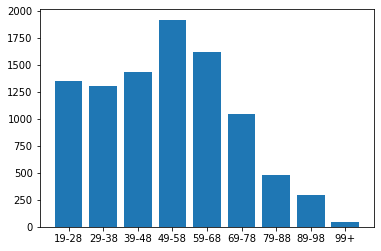

In [8]:
import datetime as DT
now = pd.Timestamp('now')
df['dob'] = pd.to_datetime(df['dob'], format='%Y-%m-%d')
df['dob'] = df['dob'].where(df['dob'] < now, df['dob'] -  np.timedelta64(100, 'Y'))   # 2
df['age'] = ((now - df['dob']).dt.total_seconds() / (365.25 * 24 * 60 * 60)).astype(int)
labels = ['19-28', '29-38', '39-48', '49-58', '59-68', '69-78','79-88','89-98','99+']
df['Age_Group'] = df['age'].apply(get_age_group)

newdf = df[df.is_fraud != 0]

fig, ax = plt.subplots()
ax.bar(labels, newdf.groupby(["Age_Group"]).count()["is_fraud"])
plt.show()

### Which age groups are more susceptible to fraudulent transactions?

Based on the seperation of my age groups it seems that age range 49-58 seems to be the most susceptible to fraudulent transactions. As age does seem to have an impact on how often fraud happens it will be useful to engineer a feature specifically for this.

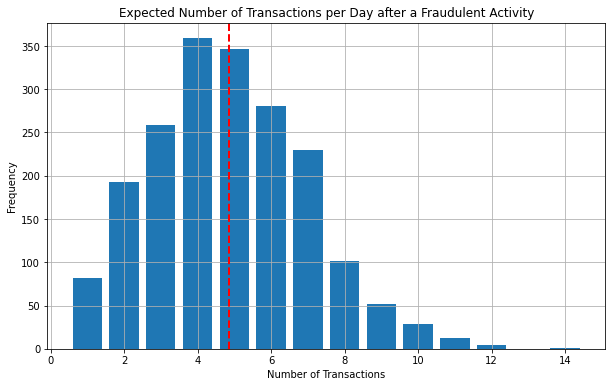

In [10]:
# df['trans_date'] = pd.to_datetime(df['trans_date_trans_time']).dt.date

fraud_df = df[df['is_fraud'] == 1]

fraud_counts = fraud_df.groupby(['cc_num', 'trans_date']).size()

expected_value = fraud_counts.mean()

plt.figure(figsize=(10, 6))
fraud_counts.hist(bins=range(int(fraud_counts.min()), int(fraud_counts.max()) + 2), align='left', rwidth=0.8)
plt.axvline(expected_value, color='red', linestyle='dashed', linewidth=2)
plt.title('Expected Number of Transactions per Day after a Fraudulent Activity')
plt.xlabel('Number of Transactions')
plt.ylabel('Frequency')
plt.show()

### If a fraudulent transaction has been committed, what is the expected number of transaction committed per day with the same victim? (Temporal component asking do fraudulent transactions occur multiple times on the same customer)

Based on my graph above it seems that the expected number of transactions committed per day with the same victim will most likely be 5. This will affect my feature engineering as it would be usuful to create a group that will trigger for multiple transactions in short periods of time.

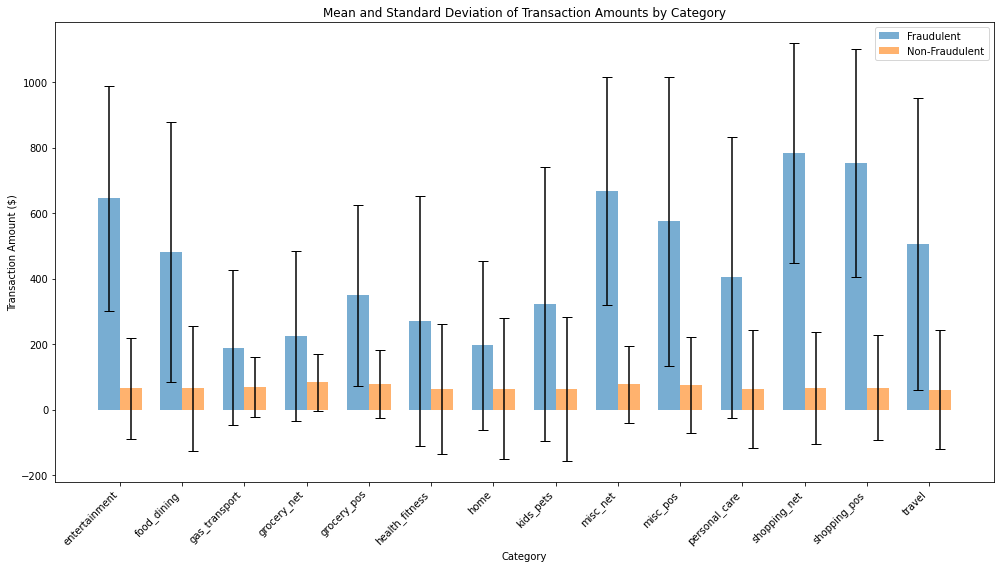

In [11]:
fraud_df = df[df['is_fraud'] == 1]
non_fraud_df = df[df['is_fraud'] == 0]

fraud_stats = fraud_df.groupby('category')['amt'].agg(['mean', 'std']).reset_index()
non_fraud_stats = non_fraud_df.groupby('category')['amt'].agg(['mean', 'std']).reset_index()

plt.figure(figsize=(14, 8))

n_categories = fraud_stats.shape[0]
index = np.arange(n_categories)

bar_width = 0.35

plt.bar(index, fraud_stats['mean'], bar_width, yerr=fraud_stats['std'], capsize=5, label='Fraudulent', alpha=0.6)
plt.bar(index + bar_width, non_fraud_stats['mean'], bar_width, yerr=non_fraud_stats['std'], capsize=5, label='Non-Fraudulent', alpha=0.6)

plt.xlabel('Category')
plt.ylabel('Transaction Amount ($)')
plt.title('Mean and Standard Deviation of Transaction Amounts by Category')
plt.xticks(index + bar_width / 2, fraud_stats['category'], rotation=45, ha="right")
plt.legend()

plt.tight_layout()
plt.show()

### For each purchase "category," plot the mean and standard "amt" between fraudulent transactions and non-fraudulent transactions

As we can see there is a large difference between fraudulent and non-fraudulent transactions in certain categories. This will affect my feature creation as I may want to make "standardized amounts" within categories for the model to more easily identify outliers.

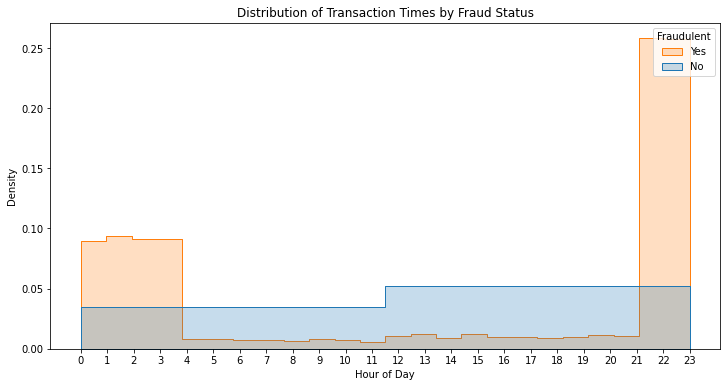

In [18]:
# df['trans_date_trans_time'] = pd.to_datetime(df['trans_date_trans_time'])
# df['trans_time'].head()
df['trans_time'] = pd.to_datetime(df['trans_time'], format='%H:%M:%S')
df['transaction_hour'] = df['trans_time'].dt.hour

plt.figure(figsize=(12, 6))
sns.histplot(data=df, x='transaction_hour', hue='is_fraud', bins=24, element='step', stat='density', common_norm=False)
plt.title('Distribution of Transaction Times by Fraud Status')
plt.xlabel('Hour of Day')
plt.ylabel('Density')
plt.xticks(range(0, 24))
plt.legend(title='Fraudulent', labels=['Yes', 'No'])

plt.show()

### What is the distribution between time transactions between fraudulent transactions and non-fraudulent transactions? What is the most likely time of a fraudulent transaction?

It seems that the distribution between time transactions between fraudulent transactions and non-fraudulent transactions the most liklely time for fraud is between the hours of 21-24 a smaller amount in the timeframe of 0-4. A feature capturing time of day will be very useful for the model.

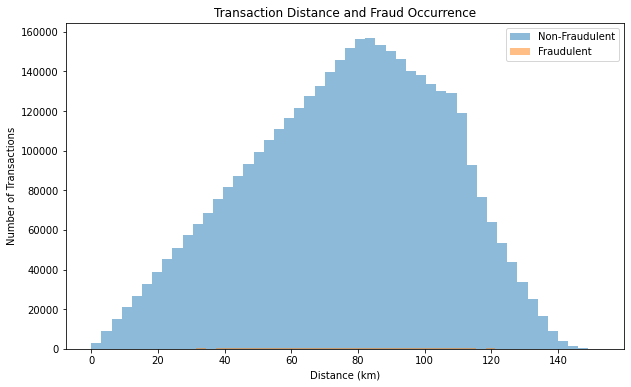

In [20]:
from math import radians, cos, sin, asin, sqrt

def haversine(lon1, lat1, lon2, lat2):
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])

    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a))
    r = 6371 
    return c * r

df['distance'] = df.apply(lambda x: haversine(x['long'], x['lat'], x['merch_long'], x['merch_lat']), axis=1)

fig, ax = plt.subplots(figsize=(10, 6))

fraud_distances = df[df['is_fraud'] == 1]['distance']
non_fraud_distances = df[df['is_fraud'] == 0]['distance']

ax.hist(non_fraud_distances, bins=50, alpha=0.5, label='Non-Fraudulent')
ax.hist(fraud_distances, bins=50, alpha=0.5, label='Fraudulent')

ax.set_xlabel('Distance (km)')
ax.set_ylabel('Number of Transactions')
ax.set_title('Transaction Distance and Fraud Occurrence')
ax.legend()

plt.show()

### Is there a relationship between the distance between customer location (lat/lon) and merchant location (merch_lat/merch_lon) and fraudulent transactions?

There doesn't seem to be a major impact on distance for fraudulent transactions. It will most likely be useful to drop this or weight this category much less than other features.

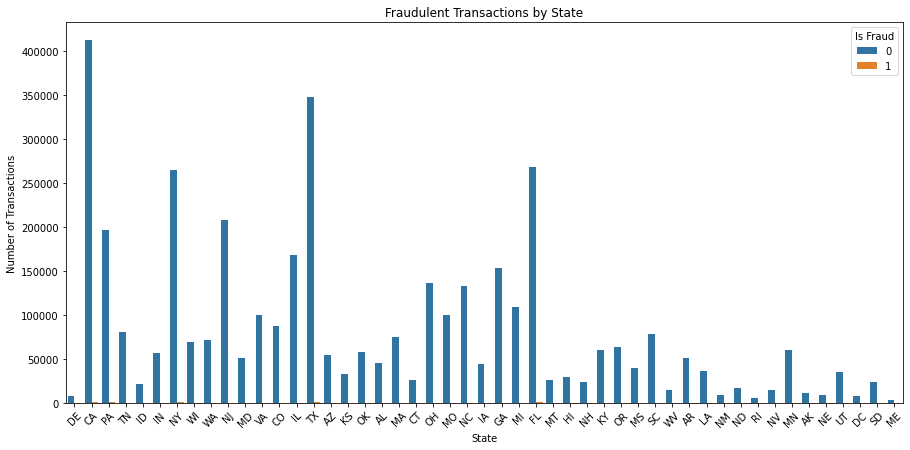

In [21]:
plt.figure(figsize=(15, 7))
sns.countplot(x='state', hue='is_fraud', data=df)
plt.title('Fraudulent Transactions by State')
plt.xticks(rotation=45)
plt.ylabel('Number of Transactions')
plt.xlabel('State')
plt.legend(title='Is Fraud')
plt.show()

### Are certain states, cities, and zip codes more susceptible to fraudulent transactions?

Based on the graph above it does seem like there is massive differences in fraud based on state. Implementing state spefcific feautures or adjusting the risk levels by state will be useful. It may even be useful for more accurate models to be created on a state by state basis.

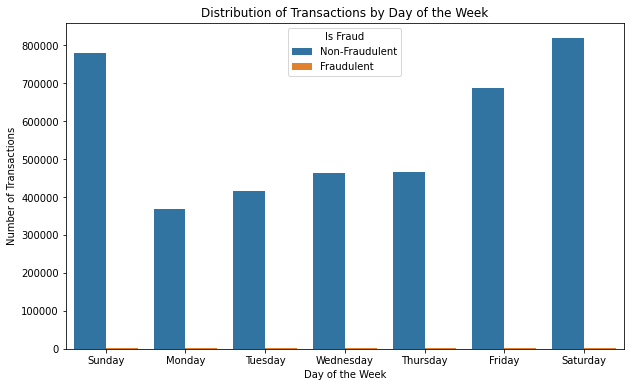

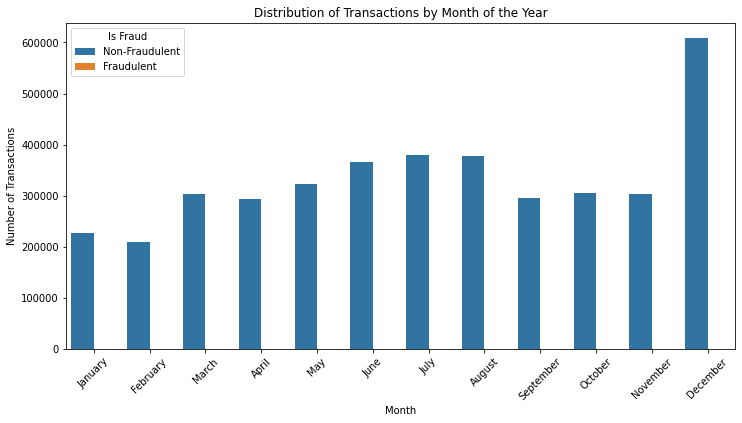

In [23]:
df['day_of_week'] = pd.to_datetime(df['trans_date']).dt.day_name()
df['month'] = pd.to_datetime(df['trans_date']).dt.month_name()

days_order = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']
months_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='day_of_week', hue='is_fraud', order=days_order)
plt.title('Distribution of Transactions by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Transactions')
plt.legend(title='Is Fraud', labels=['Non-Fraudulent', 'Fraudulent'])
plt.show()

plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='month', hue='is_fraud', order=months_order)
plt.title('Distribution of Transactions by Month of the Year')
plt.xlabel('Month')
plt.ylabel('Number of Transactions')
plt.legend(title='Is Fraud', labels=['Non-Fraudulent', 'Fraudulent'])
plt.xticks(rotation=45)
plt.show()

### What is the distribution of fraudulent and non-fraudulent transactions occurring for each day of the week (i.e., Sunday, Monday, etc.), each month of the year (i.e., January, February)?

For day of the week it does seem to vary. Certain months also have more fraudulent cases than others. It will most likely be useful to include atleast day of the week as a feature for the model to interpret.

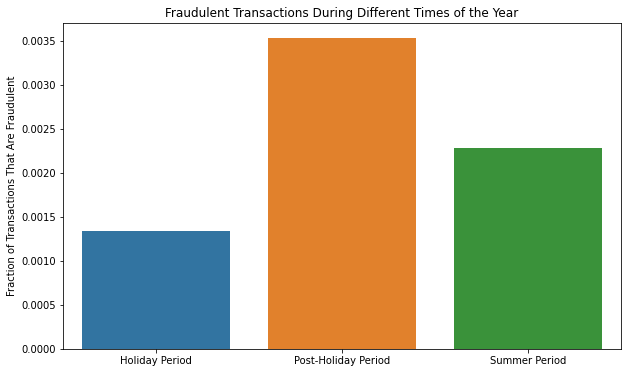

In [26]:
df['date'] = pd.to_datetime(df['trans_date']).dt.date

holiday_period = df['date'].apply(lambda x: x.month == 12 or (x.month == 11 and x.day >= 30))
post_holiday_period = df['date'].apply(lambda x: x.month == 1 or (x.month == 2 and x.day <= 28))
summer_period = df['date'].apply(lambda x: x.month >= 5 and x.month <= 9)

plt.figure(figsize=(10, 6))
sns.barplot(x=['Holiday Period', 'Post-Holiday Period', 'Summer Period'],
            y=[df[holiday_period]['is_fraud'].mean(), df[post_holiday_period]['is_fraud'].mean(), df[summer_period]['is_fraud'].mean()])
plt.title('Fraudulent Transactions During Different Times of the Year')
plt.ylabel('Fraction of Transactions That Are Fraudulent')
plt.show()

### Compared to any other time of the year, how prevalent are fraudulent transactions during the holidays (11-30 to 12-31)? During post-holidays (1-1 to 2-28)? During the summer (05-24 to 09-01)?

There seems to be a major jump in fraud cases in the post-holiday period. These major differences in fraud transactions during different times of the year make me believe that adding a temporal feature for the model will be very useful.

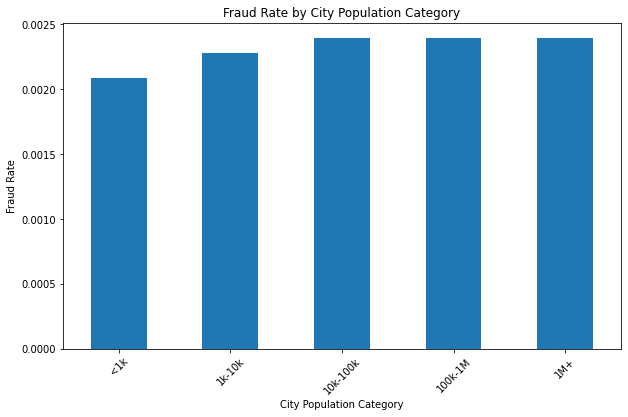

In [27]:
bins = [0, 1000, 10000, 100000, 1000000, 10000000]
labels = ['<1k', '1k-10k', '10k-100k', '100k-1M', '1M+']
df['city_pop_category'] = pd.cut(df['city_pop'], bins=bins, labels=labels)

fraud_rates = df.groupby('city_pop_category')['is_fraud'].mean()

plt.figure(figsize=(10, 6))
fraud_rates.plot(kind='bar')
plt.title('Fraud Rate by City Population Category')
plt.xlabel('City Population Category')
plt.ylabel('Fraud Rate')
plt.xticks(rotation=45)
plt.show()

### Is there a relationship between between "city_pop" and incidence of fraud?

There doesnt seem to be much of a relationship between city population and incidence of fraud. It would be useful to either not use it as a feature or ensure its weight is much lower than other more related features.

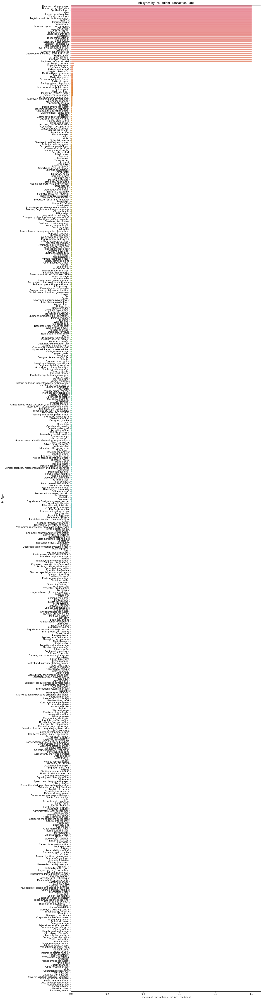

In [28]:
plt.figure(figsize=(15, 80))
job_fraud = df.groupby('job')['is_fraud'].mean().sort_values(ascending=False)
sns.barplot(x=job_fraud.values, y=job_fraud.index)
plt.title('Job Types by Fraudulent Transaction Rate')
plt.xlabel('Fraction of Transactions That Are Fraudulent')
plt.ylabel('Job Type')
plt.show()

### Are certain "job" types susceptible to fraudulent transactions?

Certain job types are definitely more susceptible to fraudulent transactions based on my graph above.Creating a feature that utilizes job types will be very useful for my model.

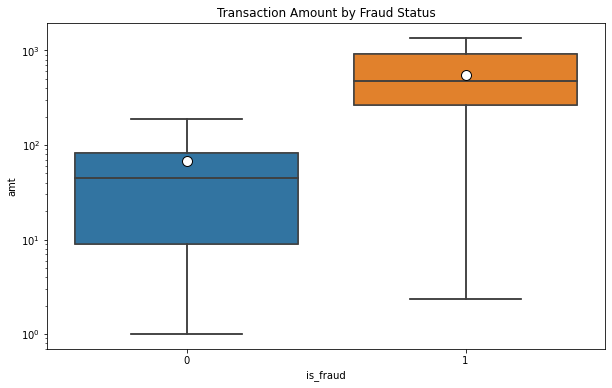

In [30]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='is_fraud', y='amt', data=df, showfliers=False)  
plt.yscale('log')  
plt.title('Transaction Amount by Fraud Status')
plt.xlabel('Is Fraudulent')
plt.ylabel('Transaction Amount (log scale)')
plt.xticks([0, 1], ['Non-Fraudulent', 'Fraudulent'])
sns.boxplot(x='is_fraud', y='amt', data=df, showfliers=False, showmeans=True,
            meanprops={"marker":"o","markerfacecolor":"white", "markeredgecolor":"black", "markersize":"10"})
plt.show()

### How does the transaction amount differ between fraudulent and non-fraudulent transactions?

There does seem to be a transaction amount difference between fraudulent and non-fraudulent transactions. This informs me that a feature focusing on amount per transaction, especially for higher transactions may be useful.

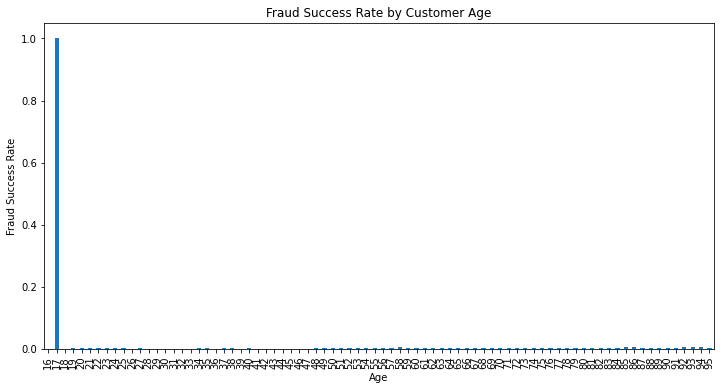

In [31]:
fraud_success_rate_by_age = df[df['is_fraud'] == 1].groupby('age').size() / df.groupby('age').size()

plt.figure(figsize=(12, 6))
fraud_success_rate_by_age.plot(kind='bar')
plt.title('Fraud Success Rate by Customer Age')
plt.xlabel('Age')
plt.ylabel('Fraud Success Rate')
plt.show()

### What is the success rate of fraudulent transactions as a function of customer age?

This graph shows me that overall each age group has a pretty low success rate for fraud. It does give me a slight insight that age 21 and 98 may have very little data to them as their success rate is 100% while everyone elses is near 0. This will affect my features as it informs me that focusing on age groups will be more accurate than exact ages due to the data.

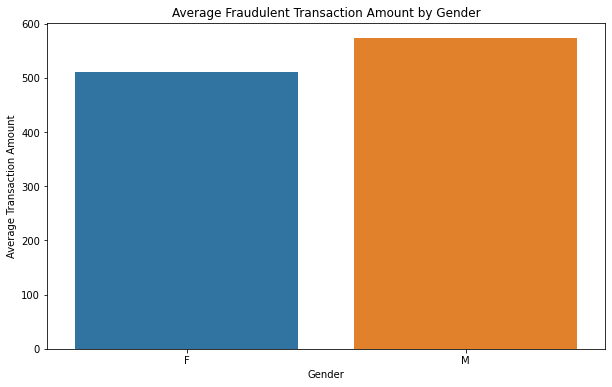

In [33]:
fraud_transactions = df[df['is_fraud'] == 1]

avg_amt_by_gender = fraud_transactions.groupby('gender')['amt'].mean().reset_index()

plt.figure(figsize=(10, 6))
sns.barplot(data=avg_amt_by_gender, x='gender', y='amt')
plt.title('Average Fraudulent Transaction Amount by Gender')
plt.xlabel('Gender')
plt.ylabel('Average Transaction Amount')
plt.show()

### What is the average transaction amount by gender for fraudulent transactions?

This graph shows that there is not much difference between gender in fraudulent transactional amount. This may not be useful as a main feature but this knowledge could help me fine tune a model with this information weighted lower than other information.

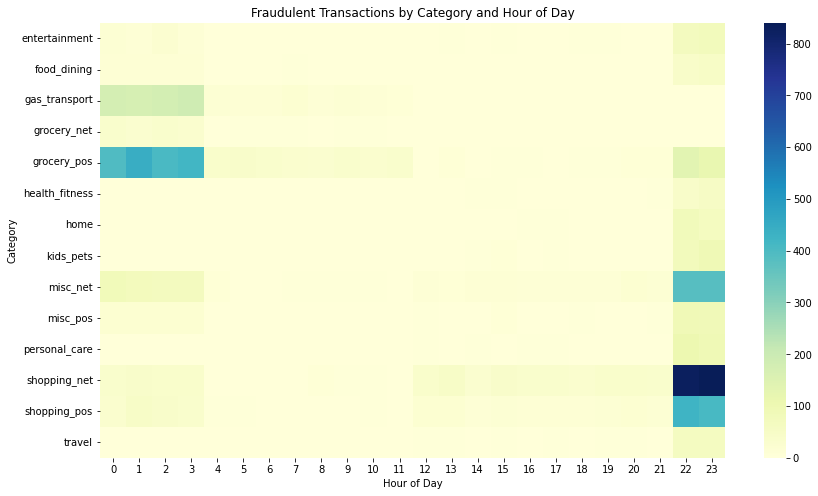

In [34]:
df['hour'] = pd.to_datetime(df['trans_time']).dt.hour

fraud_transactions = df[df['is_fraud'] == 1]

fraud_by_category_hour = fraud_transactions.groupby(['category', 'hour']).size().unstack(fill_value=0)

plt.figure(figsize=(14, 8))
sns.heatmap(fraud_by_category_hour, cmap="YlGnBu")
plt.title('Fraudulent Transactions by Category and Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Category')
plt.show()

### Is there a pattern in the time of day that fraudulent transactions occur for different categories?

This graph shows me that there is not a ton of correlation between time of day to specific categories. It furthers my thought on an earlier graph that focusing on time of day for a feature will be more important than category that was affected. It does point out that shopping_net has major fraudulent transactions at 22 and 23 hours compared to the rest of the categories however.